### Notebool to visualize K neighobors of patches from the centroid

In [1]:
%matplotlib inline 
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from pylab import *
from matplotlib.colors import Colormap

import tensorflow as tf
from tensorflow.contrib.data import parallel_interleave

/home/tkurihana/.conda/envs/tf-cpu/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/tkurihana/.conda/envs/tf-cpu/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/tkurihana/.conda/envs/tf-cpu/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/tkurihana/.conda/envs/tf-cpu/lib/python3

In [2]:
import cv2
import re
import gc
import sys

In [3]:
def get_masks(rpatch_size, channels):

    mask = np.zeros((rpatch_size, rpatch_size), dtype=np.float64)
    cv2.circle(mask, center=(rpatch_size // 2, rpatch_size // 2),
                radius=rpatch_size//2, color=1, thickness=-1)
    mask = np.expand_dims(mask, axis=-1)
    #  multiple dimension
    mask_list = [ mask for i in range(channels)]
    masks = np.concatenate(mask_list, axis=-1)
    return masks

In [4]:
def data_extractor_resize_fn(filelist,prefetch=1,height=32,width=32,channel=6,read_threads=4, distribute=(1, 0)):
    def parser(ser):
        """
        Decode & Pass datast in tf.record
        *Cuation*
        floating point: tfrecord data ==> tf.float64
        """
        features = {
            "shape": tf.FixedLenFeature([3], tf.int64),
            "patch": tf.FixedLenFeature([], tf.string),
            "filename": tf.FixedLenFeature([], tf.string),
            "coordinate": tf.FixedLenFeature([2], tf.int64),
        }
        decoded = tf.parse_single_example(ser, features)
        patch = tf.reshape(
            tf.decode_raw(decoded["patch"], tf.float64), decoded["shape"]
        )
        # conversion of tensor
        patch = tf.cast(patch, tf.float32)
        patch = tf.image.resize_images(patch, (height, width))
        return patch
    
    dataset = (
        tf.data.Dataset.list_files(filelist, shuffle=True)
            .shard(*distribute)
            .apply(
            parallel_interleave(
                lambda f: tf.data.TFRecordDataset(f).map(parser),
                cycle_length=read_threads,
                sloppy=True,
            )
        )
    )
    iterator = dataset.make_one_shot_iterator()

    next_element = iterator.get_next()
    patches_list = []
    with tf.Session() as sess:
        try:
            while True:
                patch = sess.run(next_element)
                patches_list.append(patch)
        except tf.errors.OutOfRangeError:
            print("OutOfRage --> finish process")
            pass
    return patches_list

##### Load tfdata

In [5]:
tf_datadir = "/home/tkurihana/Research/data/tfrecords/clouds_laads_multiprocessed_2000_2018_2"

In [6]:
filelist = glob.glob(os.path.join(tf_datadir, '2-10*.tfrecord'))

- fig size 32x32

In [7]:
nfiles = 1
fdx = np.random.randint(0,len(filelist),nfiles)
patches_list = []
for ifile in [filelist[i] for i in fdx]:
    patches_list.append(data_extractor_resize_fn([ifile],height=32,width=32,channel=2 ))
print("NORMAL END")

Instructions for updating:
Use `tf.data.experimental.parallel_interleave(...)`.
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.experimental.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_determinstic`.
Instructions for updating:
Use `for ... in dataset:` to iterate over a dataset. If using `tf.estimator`, return the `Dataset` object directly from your input function. As a last resort, you can use `tf.compat.v1.data.make_one_shot_iterator(dataset)`.
OutOfRage --> finish process
NORMAL END


In [8]:
patches = np.concatenate(
    [np.expand_dims(i, axis=0).reshape(1,32,32, 6) for i in patches_list[0]],
    axis=0)
patches.shape

(2000, 32, 32, 6)

- fig size 128x128

In [9]:
nfiles = 1
fdx = np.random.randint(0,len(filelist),nfiles)
patches_list = []
for ifile in [filelist[i] for i in fdx]:
    patches_list.append(data_extractor_resize_fn([ifile],height=128,width=128,channel=2 ))
print("NORMAL END")

OutOfRage --> finish process
NORMAL END


In [10]:
opatches = np.concatenate(
    [np.expand_dims(i, axis=0).reshape(1,128,128, 6) for i in patches_list[0]],
    axis=0)
opatches.shape

(2000, 128, 128, 6)

In [11]:
## NaN Mask
width = height = patch_size = 32
nan_mask = get_masks(patch_size, 1).reshape(width,height)
nan_idx = np.where(nan_mask == 0) # (array([x,x,x,x,]) , array([y,y,y,y,y,]))
nan_mask[nan_idx] = np.nan #

In [12]:
## NaN Mask
width = height = patch_size = 128
nan_omask = get_masks(patch_size, 1).reshape(width,height)
nan_idx = np.where(nan_omask == 0) # (array([x,x,x,x,]) , array([y,y,y,y,y,]))
nan_omask[nan_idx] = np.nan #

----------------------------

##### Load number of patches in each cluster; order of closest  

In [13]:
def txtloader(datadir, fname=None):
    with open(os.path.join(datadir, fname),'r') as f:
        lines = f.read()
        data_list = []
        for line in lines.split("\n"):
            tmp = []
            for i in line.split(" "):
                if len(i) > 0:
                    tmp.append(i.strip(" "))
            data_list.append(tmp)
    return data_list

In [14]:
expnames = [67011582, 'm2_02_global_2000_2018_band28_29_31' ]

In [15]:
index_list = []
index_list.append(txtloader(datadir='.', fname='select_{}.txt'.format(str(expnames[0]) )))
index_list.append(txtloader(datadir='.', fname='select_{}.txt'.format(str(expnames[1]) )))

In [16]:
index_list[0][0]

['18', '21', '23', '20', '17', '8', '13', '24', '14', '12']

-------------------------
##### Load matrix of strings to complex 

In [17]:
def matrixloader(datadir, fname='ooo'):
    with open(os.path.join(datadir, fname),'r') as f:
        lines = f.read()
        data_list = []
        for line in lines.split("\n"):
            tmp = []
            tmp = [ complex(i.replace('i', 'j'))  for i in line.split(",") if len(i) > 0 ]
            #for i in line.split(","):
            #    if len(i) > 0:
            #        #print(i, len(i))
            #        tmp.append(complex(i.replace('i', 'j')))
            if len(tmp) > 0:
                array = np.array(tmp, dtype=np.complex64).reshape(1,-1)
                data_list.append(array)
        darray = np.concatenate(data_list, axis=0)
    return darray

In [18]:
def run_matrixloader(datadir, index_list=None, expname=None, nclusters=0):
    matrix_list = []
    for cluster in range(nclusters):
        databasedir = os.path.join(datadir,"{}/cluster-{}_N-{}".format(str(expname), cluster, nclusters))
        tmp_matrix_list = []
        for idx in index_list[cluster]:
            bname = "fig_clustering_low-{}_gray_n-{}_N-{}_table.csv".format(str(expname),idx, nclusters )
            tmp_matrix_list.append(matrixloader(databasedir, fname=bname))
        matrix_list.append(tmp_matrix_list)
    return matrix_list

In [19]:
nclusters=20

In [20]:
matrix_list = []
matrix_list.append(run_matrixloader(datadir='./protocol/Orients',index_list=index_list[0],expname=expnames[0],nclusters=nclusters ))
matrix_list.append(run_matrixloader(datadir='./protocol/Orients',index_list=index_list[1],expname=expnames[1],nclusters=nclusters ))

In [21]:
matrix_list[0][0][0]

array([[0.18266+0.98255j, 0.17953+0.983j  , 0.16231+0.98649j,
        0.1537 +0.98824j],
       [0.17953+0.983j  , 0.17326+0.98427j, 0.16071+0.98682j,
        0.15444+0.98809j],
       [0.16231+0.98649j, 0.16071+0.98682j, 0.15751+0.98747j,
        0.15591+0.98779j],
       [0.1537 +0.98824j, 0.15444+0.98809j, 0.15591+0.98779j,
        0.15665+0.98764j]], dtype=complex64)

##### Clustering assignment

In [48]:
def comp_protocol_table(data_basedir='./',expname='0000',kernel_list=[], base_kernel=1,tfname='0-0',ncluster=10):
    """ kernel_list [2,3,....] not include 1 pixel
    """
    baseline = np.load(os.path.join(
                        data_basedir+'/'+expname,
                        "clr-sklaggl__nc-"+str(ncluster)+"_kernel1_tfrecord-"+tfname+".npy"
                    )
                )
    # MOSAIC: "clr-sklaggl__kernel1_tfrecord-"+tfname+".npy"
    #"clr-sklaggl__nc-"+str(ncluster)+"_kernel1_tfrecord-"+tfname+".npy"
    print(f'check array shape {baseline.shape}')
    return baseline

In [46]:
cluster_basedatadir = '/home/tkurihana/Research/rotate_invariant/stepbystep/transform/protocol/clustering'

In [49]:
#2-10 * holdoutset
results_list = []
for expname in expnames:
    result = comp_protocol_table(data_basedir=cluster_basedatadir,
                                 expname=str(expname), kernel_list=1,tfname='2-10',ncluster=nclusters)
    results_list.append(result)

check array shape (2000,)
check array shape (2000,)


---------------------
#### Visualization

In [22]:
np.arange(2,100,10)

array([ 2, 12, 22, 32, 42, 52, 62, 72, 82, 92])

In [138]:
def quiver_fn(img, orient):
    step1 = img.shape[0]/orient.shape[0]
    step2 = img.shape[1]/orient.shape[1]
    x, y = np.meshgrid(
        np.arange(step1/2,img.shape[0],step1),
        np.arange(step2/2,img.shape[1],step2),
    )
    u = -orient.real / abs(orient)
    v = -1*orient.imag / abs(orient)
    """ Must flip v, u instead of u, v for converting matlab to python system
    """
    return x,y,v, u
    #dx = np.array([i for i in range(0,len(x),2)])
    #return x[dx,dx], y[dx,dx], v[dx,dx], u[dx,dx]
    #return x[1:,1:], y[1:,1:], v[1:,1:], u[1:,1:]

In [150]:
def base_plot(imgs_list,cluster_list, orients,nan_mask, index_list, size=(4,3),dpi=100, 
              nrow=2, ncol=5, expname=None, linewidth=5,headlength=15,scale=4,width=0.01,alpha=1,headwidth=3,
              cmap='jet', nmin=0, nmax=1, nclusters=20):
    fig,ax  = plt.subplots(ncol, nrow,figsize=size,dpi=dpi)
    plt.subplots_adjust(wspace=0.01, hspace=0.01)
    for icol, cluster in enumerate(range(nclusters)):
        tmp_imgs_list = imgs_list[np.where(cluster_list == cluster)]
        for ii,i in enumerate(index_list[cluster]) :
            ax[ii][icol].imshow(tmp_imgs_list[int(i),:,:,0]*nan_mask,
                                vmin=nmin, vmax=nmax, cmap=cmap,alpha=alpha)
            ax[ii][icol].set_xticklabels([])
            ax[ii][icol].set_yticklabels([])
            ax[ii][icol].axis('off')
            
            # quiver
            x,y,u,v = quiver_fn(tmp_imgs_list[int(i),:,:,0], orients[icol][ii])
            #print(x,y,u,v)
            ax[ii][icol].quiver(x,y,u,v,color='black', 
                                linewidth=linewidth,units='width',scale=scale, width=width, headwidth=headwidth)
    fig.tight_layout()
    plt.show()
    #plt.savefig('./all_{}_N-{}.png'.format(expname, len(imgs_list)))
    plt.close()

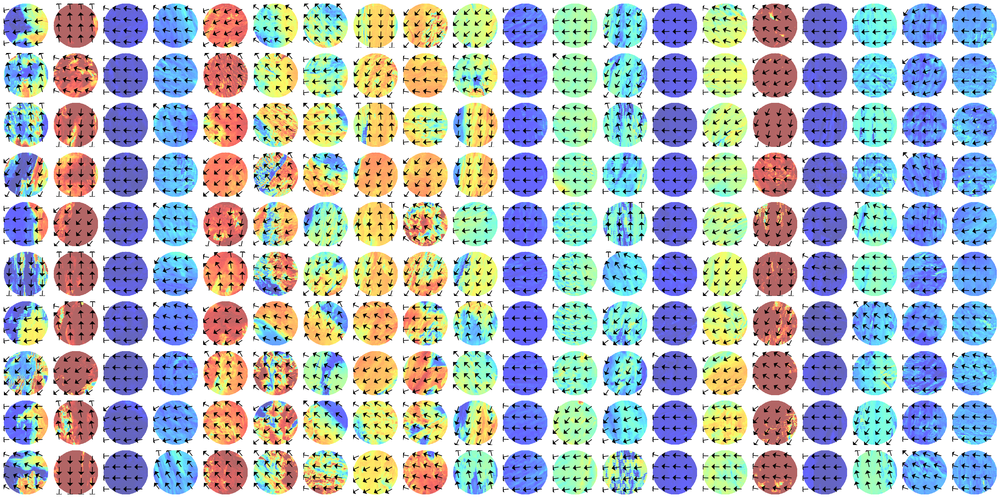

In [153]:
# RI model
base_plot(opatches, results_list[0], matrix_list[0], nan_mask=nan_omask,index_list=index_list[0],
          size=(28,14),dpi=100, nrow=20, ncol=10, expname=None, linewidth=8, nclusters=nclusters,
          headlength=25,headwidth=9,alpha=0.6,scale=5.5, width=0.015)

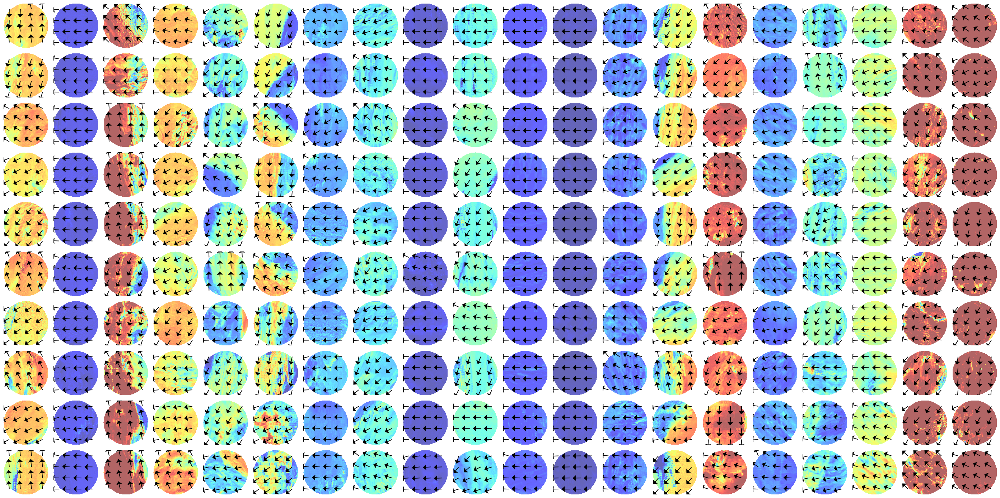

In [154]:
# No-RI model
base_plot(opatches, results_list[1], matrix_list[1], nan_mask=nan_omask,index_list=index_list[1],
          size=(28,14),dpi=100, nrow=20, ncol=10, expname=None, linewidth=8, nclusters=nclusters,
          headlength=25,headwidth=9,alpha=0.6,scale=5.5, width=0.015)